# DL Assignment 1
## Contributor:
- Abhimanyu Gupta (2019226)
- Meenal Gurbaxani (2019434)

# Part 1 : Perceptron Training Algorithm

In [1]:
!pip install --upgrade matplotlib #for axline

In [2]:
import numpy as np
from numpy import array
import matplotlib.pyplot as plt
import random

In [3]:
random.seed(12345)
np.random.seed(12345)

## 1) PTA

In [4]:
def plot_points(x, y):
    xx, yy = x.T
    plt.xlim(np.min(x[:,0]) - 0.5, np.max(x[:,0]) + 0.5)
    plt.ylim(np.min(x[:,1]) - 0.5, np.max(x[:,1]) + 0.5)
    plt.grid()
    
    n = x.shape[0]
    colors = ['red', 'green']
    for i in range(n):
        color = colors[y[i] == 1]
        plt.plot(xx[i], yy[i], marker="o", markersize=20, markerfacecolor=color)

    plt.show()

In [5]:
def plot_points_with_decision_boundary(x, y, w):
    w1, w2, b = w
    xx = -b / (w1 + 1e-10)
    yy = -b / (w2 + 1e-10)

    c = yy
    m = -yy / (xx + 1e-10)

    line_x_coords = np.array([0, xx])
    line_y_coords = m * line_x_coords + c

    plt.axline(line_x_coords, line_y_coords)

    plot_points(x, y)

In [6]:
def predict(x, w):
    x_ = np.hstack((x, np.ones((x.shape[0],1)))).astype(int).T
    y_ = w.T @ x_
    y = np.array([z(yy) for yy in y_])

    return y

In [12]:
def z(x) :
    if x >= 0 :
        return 1
    else :
        return -1

def pta(x, y) :
    x_ = np.hstack((x, np.ones((x.shape[0],1)))).astype(int)
    w = np.random.normal(0, 1, x_.shape[1]) * 0.01
 
    plot_points_with_decision_boundary(x, y, w)

    weight_updates = 0
    weight_update_limit = 100
    misclassified = True
    while misclassified and weight_updates <= weight_update_limit :
        misclassified = False
        n = x_.shape[0]
        i = 0
        while i < n and weight_updates <= weight_update_limit :
            yy = z(w.T @ x_[i])
            if yy != y[i] :
                plot_points_with_decision_boundary(x, y, w)
                w += y[i]*x_[i]
                weight_updates += 1
                misclassified = True
            else :
                i += 1

    plot_points_with_decision_boundary(x, y, w)

    if weight_updates <= weight_update_limit :
        print(f"It took {weight_updates} steps for pta to converge")
    else:
        print(f"pta didn't converged")

    return w

Inputs [[0 0]
 [0 1]
 [1 0]
 [1 1]]
True Value [-1 -1 -1  1]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  # Remove the CWD from sys.path while we load stuff.


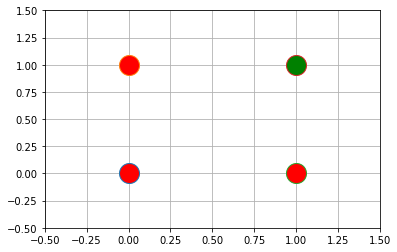

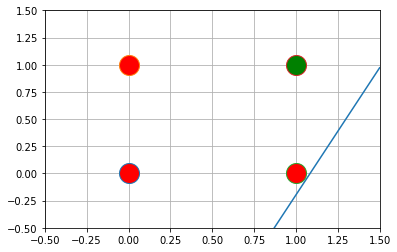

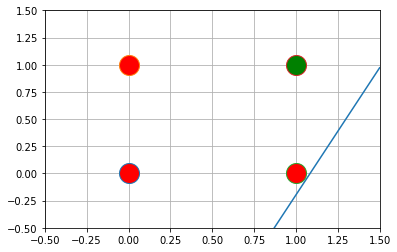

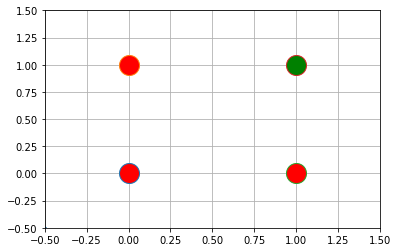

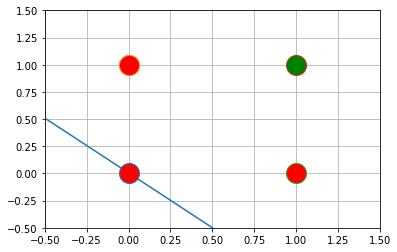

...

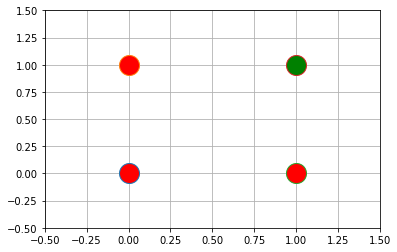

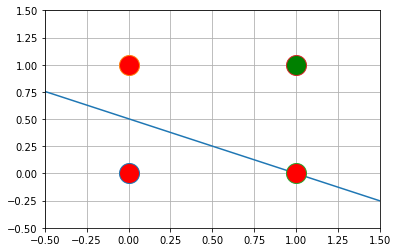

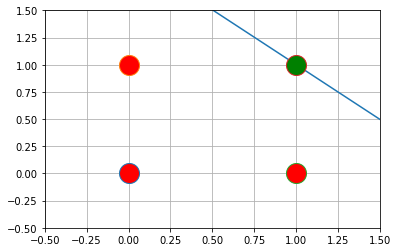

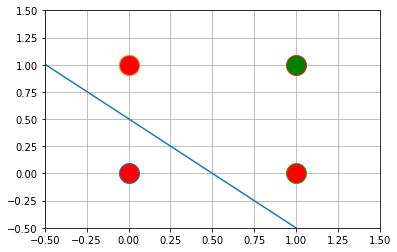

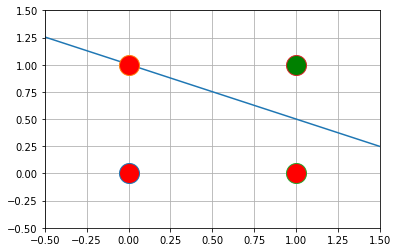

It took 10 steps for pta to converge
Predictions [-1 -1 -1  1]


In [8]:
# And

x = np.array([[xx, yy] for xx in range(2) for yy in range(2)])
y = np.array([xx and yy for xx, yy in x])
y[y == 0] = -1

print("Inputs", x)
print("True Value", y)
plot_points(x, y)

w = pta(x, y)
yy = predict(x, w)

print("Predictions", yy)

Inputs [[0 0]
 [0 1]
 [1 0]
 [1 1]]
True Value [-1  1  1  1]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  # Remove the CWD from sys.path while we load stuff.


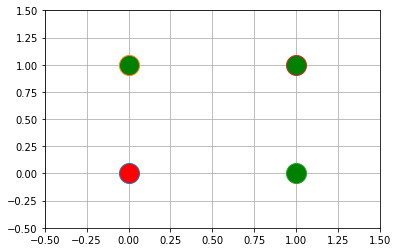

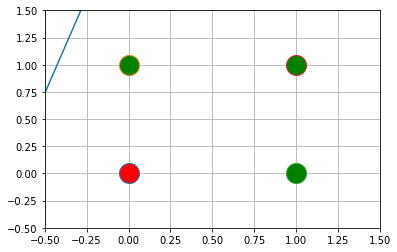

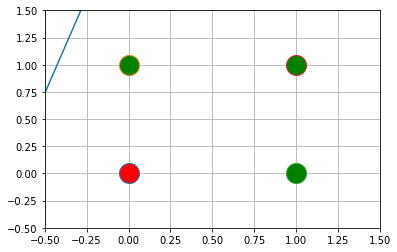

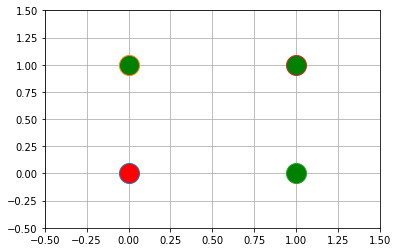

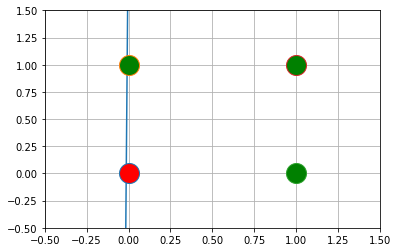

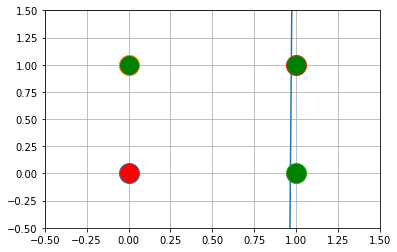

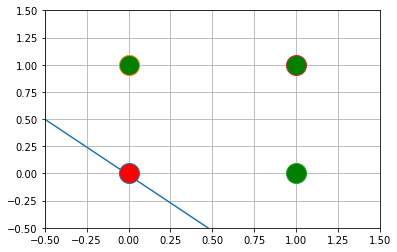

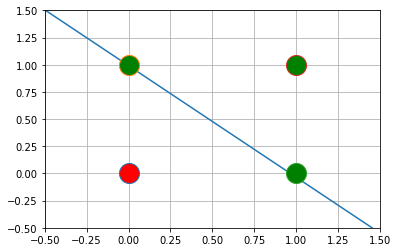

It took 5 steps for pta to converge
Predictions [-1  1  1  1]


In [9]:
# Or

x = np.array([[xx, yy] for xx in range(2) for yy in range(2)])
y = np.array([xx or yy for xx, yy in x])
y[y == 0] = -1

print("Inputs", x)
print("True Value", y)
plot_points(x, y)

w = pta(x, y)
yy = predict(x, w)

print("Predictions", yy)

Inputs [[0 0]
 [0 1]]
True Value [ 1 -1]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  # Remove the CWD from sys.path while we load stuff.


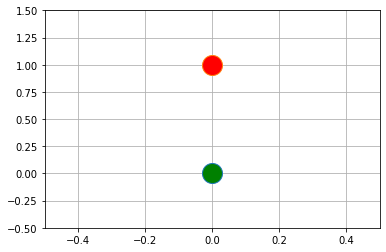

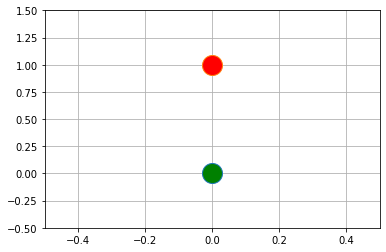

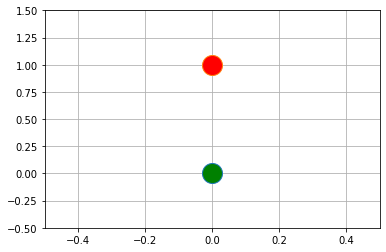

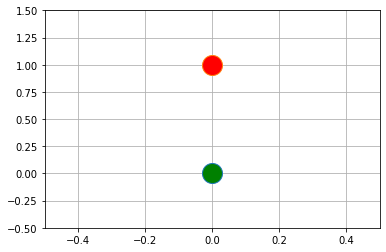

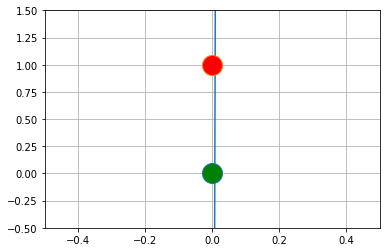

It took 2 steps for pta to converge
Predictions [ 1 -1]


In [10]:
# Not

x = np.array([[0, 0], [0, 1]])
y = np.array([int(not xx[1]) for xx in x])
y[y == 0] = -1

print("Inputs", x)
print("True Value", y)
plot_points(x, y)

w = pta(x, y)
yy = predict(x, w)

print("Predictions", yy)

Inputs [[0 0]
 [0 1]
 [1 0]
 [1 1]]
True Value [-1  1  1 -1]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  # Remove the CWD from sys.path while we load stuff.


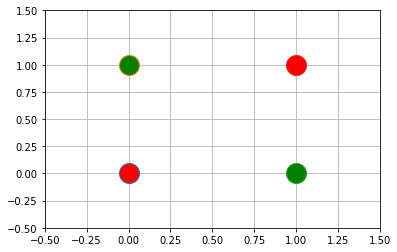

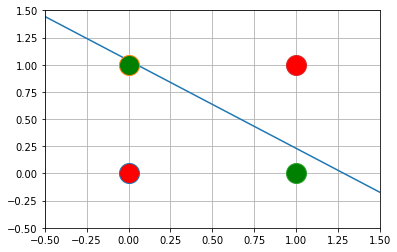

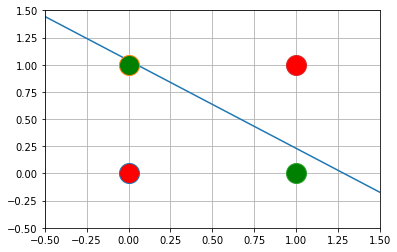

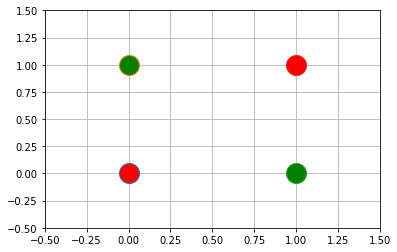

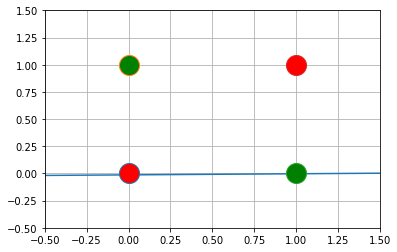

...

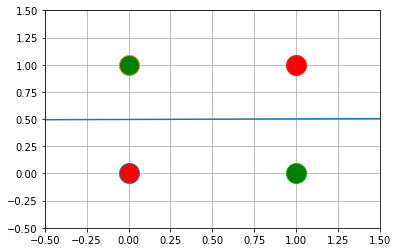

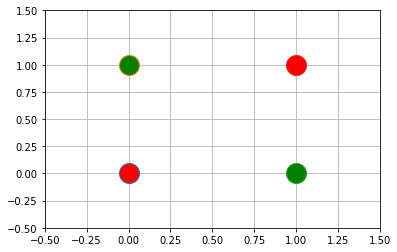

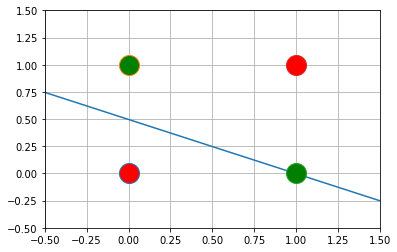

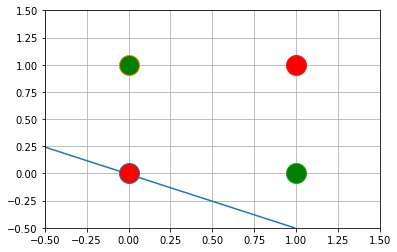

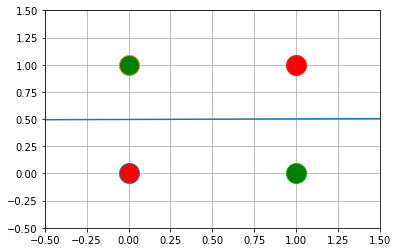

KeyboardInterrupt: ignored

In [11]:
# Xor

x = np.array([[xx, yy] for xx in range(2) for yy in range(2)])
y = np.array([xx ^ yy for xx, yy in x])
y[y == 0] = -1

print("Inputs", x)
print("True Value", y)
plot_points(x, y)

w = pta(x, y)
yy = predict(x, w)

print("Predictions", yy)

## 2) Madeleine

In [13]:
X_train = array([[5,1], [5,3], [5,5], [5,7], [5,9], [1,5], [3,5], [7,5], [9,5]])
y_train = array([[1, 0, 1, 0, 1, 1, 0, 0, 1]]).T

print(X_train.shape) 
print(y_train.shape)

(9, 2)
(9, 1)


In [14]:
class Madeleine:
    def __init__(self, hidden_neurons, X, y):
        self.layer_1 = self.layer(inputs=2, outputs=hidden_neurons)
        self.layer_2 = self.layer(inputs=hidden_neurons, outputs=1)
        self.X_train = X
        self.y_train = y
        
    def layer(self, inputs, outputs):
        layer_dict = {} 
        layer_dict["weights"] = np.random.random((inputs, outputs))*np.sqrt(2.0/outputs)           
        print(layer_dict["weights"])
        return layer_dict

    @staticmethod
    def sigmoid(x):
        return 1/(1 + np.exp(-x))

    @staticmethod
    def diff_sigmoid(x):
        return x*(1 - x)
    
    def get_output(self, inputs, layer):
        return np.dot(inputs, layer["weights"])
    
    def predict(self, inputs, layer):
        output = self.sigmoid(self.get_output(inputs, layer))
        return output
    
    def accuracy(self, gt, output, epoch):
        prediction = np.where(output>0.5, 1, 0)
        accu = (prediction == gt).sum() / len(y_train)
        accu = round(accu*100, 3)
        print(f"Training Accuracy at epoch: {epoch} is: {accu}")
        
    def train(self, epochs):
        for epoch in range(epochs):
            o1 = self.predict(self.X_train, self.layer_1) #sigmoid output from layer1
            o2 = self.predict(o1, self.layer_2) #sigmoid output from layer2
            
            error_o2 = self.y_train - o2
            grad_o2 = error_o2 * self.diff_sigmoid(o2)
            
            error_o1 = grad_o2.dot(self.layer_2["weights"].T)
            grad_o1 = error_o1 * self.diff_sigmoid(o1)
            
            self.layer_1["weights"] = self.layer_1["weights"] + self.X_train.T.dot(grad_o1)
            self.layer_2["weights"] = self.layer_2["weights"] + o1.T.dot(grad_o2)
            
            accu = self.accuracy(self.y_train, o2, epoch)


In [15]:
nn = Madeleine(4, X_train, y_train) #using 4 hidden neurons

[[0.57262395 0.6167215  0.68210886 0.51172282]
 [0.45429866 0.50731632 0.33064243 0.23022313]]
[[0.62175136]
 [1.0319362 ]
 [1.40574891]
 [0.95724398]]


In [16]:
nn.train(100)

Training Accuracy at epoch: 0 is: 55.556
Training Accuracy at epoch: 1 is: 55.556
Training Accuracy at epoch: 2 is: 55.556
Training Accuracy at epoch: 3 is: 55.556
Training Accuracy at epoch: 4 is: 55.556
Training Accuracy at epoch: 5 is: 55.556
Training Accuracy at epoch: 6 is: 44.444
Training Accuracy at epoch: 7 is: 55.556
Training Accuracy at epoch: 8 is: 44.444
Training Accuracy at epoch: 9 is: 55.556
Training Accuracy at epoch: 10 is: 44.444
Training Accuracy at epoch: 11 is: 55.556
Training Accuracy at epoch: 12 is: 44.444
Training Accuracy at epoch: 13 is: 55.556
Training Accuracy at epoch: 14 is: 44.444
Training Accuracy at epoch: 15 is: 55.556
Training Accuracy at epoch: 16 is: 44.444
Training Accuracy at epoch: 17 is: 55.556
Training Accuracy at epoch: 18 is: 44.444
Training Accuracy at epoch: 19 is: 55.556
Training Accuracy at epoch: 20 is: 55.556
Training Accuracy at epoch: 21 is: 55.556
Training Accuracy at epoch: 22 is: 44.444
Training Accuracy at epoch: 23 is: 55.556
Tr

In [17]:
nm = Madeleine(2, X_train, y_train) # To test the accuracy of 2 neurons or less
nm.train(100)

[[0.79082252 0.17091426]
 [0.02684928 0.80037024]]
[[1.27805667]
 [0.03489743]]
Training Accuracy at epoch: 0 is: 55.556
Training Accuracy at epoch: 1 is: 55.556
Training Accuracy at epoch: 2 is: 55.556
Training Accuracy at epoch: 3 is: 55.556
Training Accuracy at epoch: 4 is: 55.556
Training Accuracy at epoch: 5 is: 55.556
Training Accuracy at epoch: 6 is: 55.556
Training Accuracy at epoch: 7 is: 55.556
Training Accuracy at epoch: 8 is: 55.556
Training Accuracy at epoch: 9 is: 55.556
Training Accuracy at epoch: 10 is: 55.556
Training Accuracy at epoch: 11 is: 55.556
Training Accuracy at epoch: 12 is: 55.556
Training Accuracy at epoch: 13 is: 55.556
Training Accuracy at epoch: 14 is: 55.556
Training Accuracy at epoch: 15 is: 55.556
Training Accuracy at epoch: 16 is: 55.556
Training Accuracy at epoch: 17 is: 55.556
Training Accuracy at epoch: 18 is: 55.556
Training Accuracy at epoch: 19 is: 55.556
Training Accuracy at epoch: 20 is: 55.556
Training Accuracy at epoch: 21 is: 55.556
Traini